In [303]:
import airportsdata
import numpy as np
import networkx as nx
import pandas as pd
import itertools
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import math
import sys, time
airports = airportsdata.load()

In [331]:
def draw_flights_on_map(airline_network, axis,node_size,node_color='red', draw_node=True, draw_edge=True):
    m = Basemap()
    pos = {}
    for i in airline_network:
        longtitude = airports[i]['lon']
        latitude = airports[i]['lat']
        map_long, map_lat = m(longtitude,latitude)
        pos[i] = (longtitude, latitude)
    n_flights = np.fromiter(nx.get_edge_attributes(airline_network, 'value').values(),dtype=int)
    rgba_colors = list(n_flights/np.max(n_flights))
    # edges,n_flights = zip(*nx.get_edge_attributes(g,'value').items())
    if draw_node:
        nx.draw_networkx_nodes(airline_network,pos,
                               nodelist=airline_network.nodes(),
                               node_size=node_size,
                               node_color=node_color,
                               alpha=0.3,
                              ax=axis)
    if draw_edge:
        nx.draw_networkx_edges(airline_network,pos,
                               edgelist = airline_network.edges(),
                               edge_color=rgba_colors,
                               alpha=0.1,
                              ax=axis)
    m.drawcoastlines(ax=axis)

    m.drawcountries(ax=axis)


In [443]:
g_2019 = nx.read_gml("flightlist_20191201_20191231.gml", label="label")
g_2020_apr = nx.read_gml("flightlist_20200401_20200430.gml", label="label")
g_2020_apr.remove_edges_from(nx.selfloop_edges(g_2020_apr))
g_2019.remove_edges_from(nx.selfloop_edges(g_2019))

# Plot of overall flights on Dec 2019 and Apr 2020

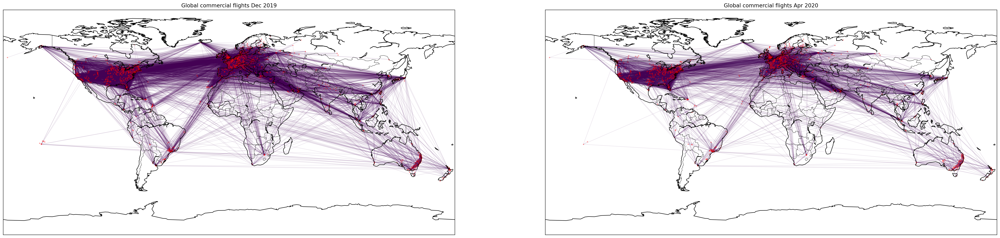

In [333]:
fig, axs = plt.subplots(1,2, figsize=(40,20), dpi=200)

draw_flights_on_map(g_2019,axs[0],3)
axs[0].set_title("Global commercial flights Dec 2019")

axs[1].set_title("Global commercial flights Apr 2020")
draw_flights_on_map(g_2020_apr,axs[1],3)


In [235]:
# Get euclidean distance between two airports
def get_distance_km(a_i, a_j, mode):
    if mode == 'weighted':
        long_1 = airports[a_i]['lon']
        long_2 = airports[a_j]['lon']
        lat_1 = airports[a_i]['lat']
        lat_2 = airports[a_j]['lat']
        return math.sqrt(((long_2 - long_1)**2) + ((lat_2 - lat_1)**2))
    elif mode == 'topology':
        return 1
    else:
        raise Exception('Unknown calculation mode')
get_distance_km('LIMC','LSZH','topology') 

1

In [253]:
# Calculate s_i
def s_i(g, node_name, mode):
    result = []
    for n in g[node_name]:
        result.append(1.0/get_distance_km(node_name, n, mode))
    if np.array(result).sum() == 0:
        return 1
    else:
        return np.array(result).sum()
s_i(g_2019,'LSZH','weighted')

43.473867900755685

0

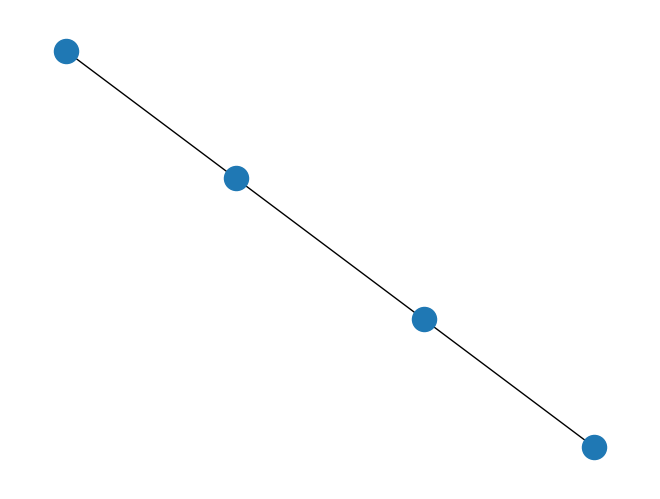

In [149]:
# Helper function determining if three nodes forms a triangle
def is_triangle(g, n_i, n_j, n_h):
    return 1 if n_i in g[n_j] and n_j in g[n_h] and n_h in g[n_i] else 0
G=nx.Graph()
G.add_edge('a','b',weight=1)
G.add_edge('a','c',weight=1)
G.add_edge('c','d',weight=1)
nx.draw(G)
is_triangle(G,'a','b','c')

In [251]:
def get_clustering_coefficient(g, mode='weighted'):
    result = {}
    for n_i in g:
        sum_of_neigh = 0
        neighbor_combs = [x for x in itertools.combinations(g[n_i], r=2)]
        for (n_j, n_h) in neighbor_combs:
            sum_of_neigh += (1.0/get_distance_km(n_i, n_j, mode) + 1.0/get_distance_km(n_i, n_h, mode)) / 2 * is_triangle(g, n_i, n_j, n_h)
        if s_i(g, n_i, mode) == 0:
            print("s_i is zero")
        i_degree_minus_1 = 1 if g.degree(n_i) - 1 == 0 else g.degree(n_i) - 1
        sum_of_neigh *= 1/(s_i(g, n_i, mode) * i_degree_minus_1)
        result[n_i] = sum_of_neigh
    return result

In [254]:
C_w = get_clustering_coefficient(g_2019)
C_c = get_clustering_coefficient(g_2019, mode='topology')

In [255]:
C_w_arr = pd.Series(C_w)
C_c_arr = pd.Series(C_c)
nodes_peri = C_w_arr.index[C_w_arr == 0].to_list()
nodes_local = C_w_arr.index[C_w_arr > C_c_arr].to_list()
nodes_global = C_w_arr.index[C_w_arr <= C_c_arr].to_list()

# Plot of peripheral, local, global clusters Dec 2019

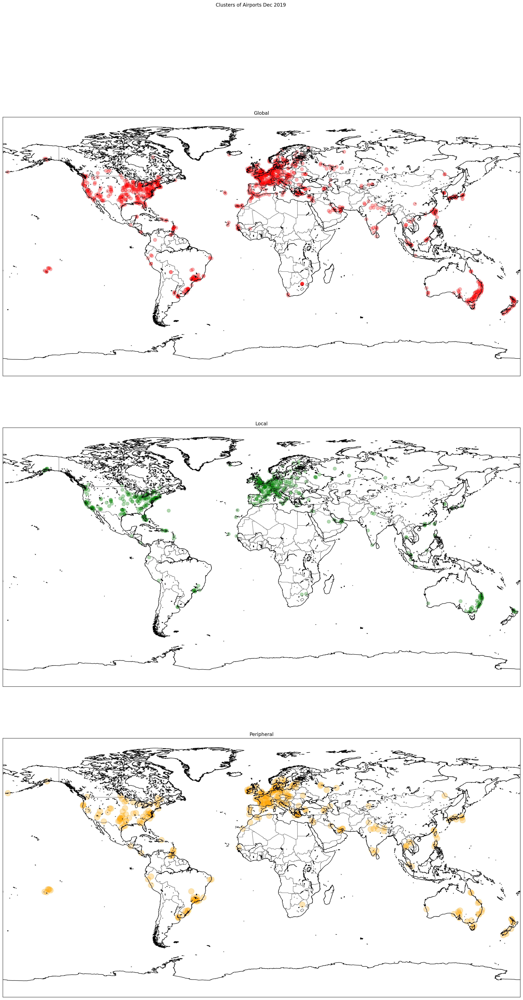

In [260]:
fig, axs = plt.subplots(3, figsize=(30,40), dpi=200)
fig.suptitle("Clusters of Airports Dec 2019")
axs[0].set_title("Global")
draw_flights_on_map(g_2019.subgraph(nodes_global), axs[0], 70,draw_edge=False, node_color='red')
axs[1].set_title("Local")
draw_flights_on_map(g_2019.subgraph(nodes_local), axs[1], 70,draw_edge=False, node_color='green')
axs[2].set_title("Peripheral")
draw_flights_on_map(g_2019.subgraph(nodes_peri), axs[2], 200,draw_edge=False, node_color='orange')

# Plot of peripheral, local, global clusters Apr 2020

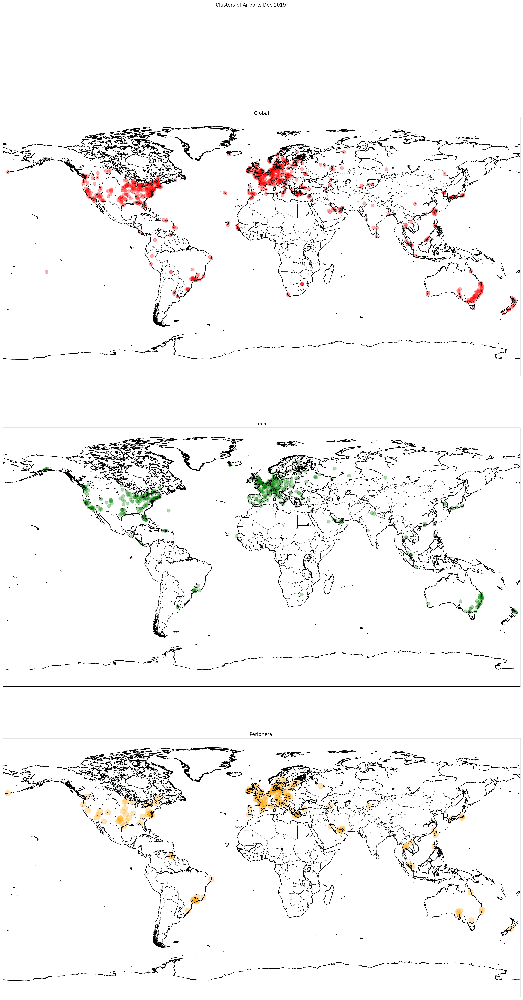

In [259]:
fig, axs = plt.subplots(3, figsize=(30,40), dpi=200)
fig.suptitle("Clusters of Airports Dec 2019")
axs[0].set_title("Global")
draw_flights_on_map(g_2020_apr.subgraph(nodes_global), axs[0], 70,draw_edge=False, node_color='red')
axs[1].set_title("Local")
draw_flights_on_map(g_2020_apr.subgraph(nodes_local), axs[1], 70,draw_edge=False, node_color='green')
axs[2].set_title("Peripheral")
draw_flights_on_map(g_2020_apr.subgraph(nodes_peri), axs[2], 200,draw_edge=False, node_color='orange')

# Perform a t-core decomposition to the graph 

In [392]:
# Instead of removing the node from graph, we add an attribute to it called t_layer, then everytime we examine the nodes that
# are not assigned a layer yet
def remove_t_layer_node(g, t):
    t_layer_nodes = []
    for n_i in g:
        # Find out nodes that are still not assigned a layer
        t_layer_attri = nx.get_node_attributes(g, 't_layer')
        unassigned_nodes = [x for x,_ in g.nodes(data=True) if x not in t_layer_attri]
        # We don't have to deal with n_i if it is already assigned a layer
        if n_i in unassigned_nodes:
            # Get number of triangles that current node is involved
            n_triangles = nx.triangles(g.subgraph(unassigned_nodes), n_i)

            # If current node is t_layer node, we add it to result and examine further if after removal there are more t_layer nodes exposed
            if n_triangles <= t:
                sys.stdout.flush()
                sys.stdout.write('\r')
                sys.stdout.flush()
                sys.stdout.write(f"Removing: {n_i}")
                t_layer_nodes.append(n_i)
                nx.set_node_attributes(g, {n_i: t}, "t_layer")
                recur_t_layer_nodes, g = remove_t_layer_node(g, t)
                t_layer_nodes += recur_t_layer_nodes       
    return t_layer_nodes, g

In [396]:
def t_core_decomposition(g):
    result = {}
    # t_index is the current t_layer to be assigned
    t_index = 0
    while len(nx.get_node_attributes(g, 't_layer')) < g.number_of_nodes() != 0:                    
        print(f"\nCurrent layer {t_index}, {len(nx.get_node_attributes(g, 't_layer'))} of {g.number_of_nodes()} nodes assigned")
        t_layer_nodes, g = remove_t_layer_node(g, t_index)
        result[t_index] = t_layer_nodes
        t_index += 1 
    return result
g_2019 = nx.read_gml("flightlist_20191201_20191231.gml", label="label")
layer_nodes = t_core_decomposition(g_2019)


Current layer 0, 0 of 1590 nodes assigned
Removing: ZYHE
Current layer 1, 308 of 1590 nodes assigned
Removing: YTGA
Current layer 2, 424 of 1590 nodes assigned
Removing: SBVG
Current layer 3, 460 of 1590 nodes assigned
Removing: YTMU
Current layer 4, 531 of 1590 nodes assigned
Removing: YNRM
Current layer 5, 551 of 1590 nodes assigned
Removing: YSPE
Current layer 6, 583 of 1590 nodes assigned
Removing: YIVL
Current layer 7, 618 of 1590 nodes assigned
Removing: RKTU
Current layer 8, 632 of 1590 nodes assigned
Removing: YTRE
Current layer 9, 649 of 1590 nodes assigned
Removing: YYNG
Current layer 10, 674 of 1590 nodes assigned
Removing: YOLA
Current layer 11, 698 of 1590 nodes assigned
Removing: YNBR
Current layer 12, 703 of 1590 nodes assigned
Removing: LFJR
Current layer 13, 710 of 1590 nodes assigned
Removing: YWGT
Current layer 14, 720 of 1590 nodes assigned
Removing: YWCH
Current layer 15, 738 of 1590 nodes assigned
Removing: YWND
Current layer 16, 753 of 1590 nodes assigned
Removi

Removing: KAKR
Current layer 142, 1071 of 1590 nodes assigned

Current layer 143, 1071 of 1590 nodes assigned
Removing: LEJR
Current layer 144, 1073 of 1590 nodes assigned
Removing: KFAY
Current layer 145, 1074 of 1590 nodes assigned

Current layer 146, 1074 of 1590 nodes assigned
Removing: OEDR
Current layer 147, 1079 of 1590 nodes assigned
Removing: KALO
Current layer 148, 1080 of 1590 nodes assigned
Removing: LFPC
Current layer 149, 1081 of 1590 nodes assigned
Removing: LSZC
Current layer 150, 1086 of 1590 nodes assigned
Removing: SBKP
Current layer 151, 1087 of 1590 nodes assigned

Current layer 152, 1087 of 1590 nodes assigned

Current layer 153, 1087 of 1590 nodes assigned

Current layer 154, 1087 of 1590 nodes assigned
Removing: WMSA
Current layer 155, 1088 of 1590 nodes assigned
Removing: KSLK
Current layer 156, 1091 of 1590 nodes assigned

Current layer 157, 1091 of 1590 nodes assigned
Removing: LIMZ
Current layer 158, 1092 of 1590 nodes assigned
Removing: CYTZ
Current layer 1

Removing: EGNR
Current layer 295, 1174 of 1590 nodes assigned
Removing: LLSD
Current layer 296, 1175 of 1590 nodes assigned

Current layer 297, 1175 of 1590 nodes assigned
Removing: GBYD
Current layer 298, 1178 of 1590 nodes assigned
Removing: LOWG
Current layer 299, 1180 of 1590 nodes assigned
Removing: MMTJ
Current layer 300, 1181 of 1590 nodes assigned

Current layer 301, 1181 of 1590 nodes assigned

Current layer 302, 1181 of 1590 nodes assigned
Removing: KBVY
Current layer 303, 1182 of 1590 nodes assigned

Current layer 304, 1182 of 1590 nodes assigned

Current layer 305, 1182 of 1590 nodes assigned

Current layer 306, 1182 of 1590 nodes assigned

Current layer 307, 1182 of 1590 nodes assigned

Current layer 308, 1182 of 1590 nodes assigned

Current layer 309, 1182 of 1590 nodes assigned

Current layer 310, 1182 of 1590 nodes assigned
Removing: EGNV
Current layer 311, 1183 of 1590 nodes assigned

Current layer 312, 1183 of 1590 nodes assigned
Removing: OEDF
Current layer 313, 1184


Current layer 453, 1242 of 1590 nodes assigned

Current layer 454, 1242 of 1590 nodes assigned

Current layer 455, 1242 of 1590 nodes assigned
Removing: KCDW
Current layer 456, 1244 of 1590 nodes assigned
Removing: KLAF
Current layer 457, 1249 of 1590 nodes assigned

Current layer 458, 1249 of 1590 nodes assigned

Current layer 459, 1249 of 1590 nodes assigned
Removing: KCCR
Current layer 460, 1253 of 1590 nodes assigned

Current layer 461, 1253 of 1590 nodes assigned

Current layer 462, 1253 of 1590 nodes assigned

Current layer 463, 1253 of 1590 nodes assigned

Current layer 464, 1253 of 1590 nodes assigned
Removing: FACT
Current layer 465, 1256 of 1590 nodes assigned
Removing: OMAM
Current layer 466, 1257 of 1590 nodes assigned

Current layer 467, 1257 of 1590 nodes assigned

Current layer 468, 1257 of 1590 nodes assigned

Current layer 469, 1257 of 1590 nodes assigned

Current layer 470, 1257 of 1590 nodes assigned

Current layer 471, 1257 of 1590 nodes assigned

Current layer 472


Current layer 614, 1298 of 1590 nodes assigned
Removing: KHSV
Current layer 615, 1299 of 1590 nodes assigned

Current layer 616, 1299 of 1590 nodes assigned

Current layer 617, 1299 of 1590 nodes assigned

Current layer 618, 1299 of 1590 nodes assigned

Current layer 619, 1299 of 1590 nodes assigned

Current layer 620, 1299 of 1590 nodes assigned

Current layer 621, 1299 of 1590 nodes assigned

Current layer 622, 1299 of 1590 nodes assigned

Current layer 623, 1299 of 1590 nodes assigned

Current layer 624, 1299 of 1590 nodes assigned
Removing: LOWI
Current layer 625, 1300 of 1590 nodes assigned

Current layer 626, 1300 of 1590 nodes assigned

Current layer 627, 1300 of 1590 nodes assigned

Current layer 628, 1300 of 1590 nodes assigned

Current layer 629, 1300 of 1590 nodes assigned

Current layer 630, 1300 of 1590 nodes assigned

Current layer 631, 1300 of 1590 nodes assigned

Current layer 632, 1300 of 1590 nodes assigned

Current layer 633, 1300 of 1590 nodes assigned

Current lay

Removing: KSGF
Current layer 780, 1327 of 1590 nodes assigned

Current layer 781, 1327 of 1590 nodes assigned
Removing: LIRP
Current layer 782, 1330 of 1590 nodes assigned

Current layer 783, 1330 of 1590 nodes assigned

Current layer 784, 1330 of 1590 nodes assigned

Current layer 785, 1330 of 1590 nodes assigned

Current layer 786, 1330 of 1590 nodes assigned

Current layer 787, 1330 of 1590 nodes assigned

Current layer 788, 1330 of 1590 nodes assigned

Current layer 789, 1330 of 1590 nodes assigned

Current layer 790, 1330 of 1590 nodes assigned

Current layer 791, 1330 of 1590 nodes assigned

Current layer 792, 1330 of 1590 nodes assigned
Removing: KFWA
Current layer 793, 1331 of 1590 nodes assigned

Current layer 794, 1331 of 1590 nodes assigned
Removing: LFLS
Current layer 795, 1332 of 1590 nodes assigned
Removing: KPUB
Current layer 796, 1334 of 1590 nodes assigned
Removing: MMUN
Current layer 797, 1335 of 1590 nodes assigned
Removing: LFLY
Current layer 798, 1337 of 1590 nodes


Current layer 945, 1358 of 1590 nodes assigned

Current layer 946, 1358 of 1590 nodes assigned

Current layer 947, 1358 of 1590 nodes assigned

Current layer 948, 1358 of 1590 nodes assigned

Current layer 949, 1358 of 1590 nodes assigned

Current layer 950, 1358 of 1590 nodes assigned

Current layer 951, 1358 of 1590 nodes assigned

Current layer 952, 1358 of 1590 nodes assigned

Current layer 953, 1358 of 1590 nodes assigned

Current layer 954, 1358 of 1590 nodes assigned

Current layer 955, 1358 of 1590 nodes assigned

Current layer 956, 1358 of 1590 nodes assigned
Removing: EDSB
Current layer 957, 1359 of 1590 nodes assigned

Current layer 958, 1359 of 1590 nodes assigned

Current layer 959, 1359 of 1590 nodes assigned

Current layer 960, 1359 of 1590 nodes assigned

Current layer 961, 1359 of 1590 nodes assigned

Current layer 962, 1359 of 1590 nodes assigned

Current layer 963, 1359 of 1590 nodes assigned

Current layer 964, 1359 of 1590 nodes assigned

Current layer 965, 1359 o


Current layer 1108, 1397 of 1590 nodes assigned

Current layer 1109, 1397 of 1590 nodes assigned

Current layer 1110, 1397 of 1590 nodes assigned

Current layer 1111, 1397 of 1590 nodes assigned

Current layer 1112, 1397 of 1590 nodes assigned
Removing: LRBS
Current layer 1113, 1399 of 1590 nodes assigned

Current layer 1114, 1399 of 1590 nodes assigned

Current layer 1115, 1399 of 1590 nodes assigned

Current layer 1116, 1399 of 1590 nodes assigned

Current layer 1117, 1399 of 1590 nodes assigned

Current layer 1118, 1399 of 1590 nodes assigned

Current layer 1119, 1399 of 1590 nodes assigned

Current layer 1120, 1399 of 1590 nodes assigned

Current layer 1121, 1399 of 1590 nodes assigned

Current layer 1122, 1399 of 1590 nodes assigned

Current layer 1123, 1399 of 1590 nodes assigned

Current layer 1124, 1399 of 1590 nodes assigned

Current layer 1125, 1399 of 1590 nodes assigned

Current layer 1126, 1399 of 1590 nodes assigned

Current layer 1127, 1399 of 1590 nodes assigned
Removi

In [435]:
def get_node_list_by_t_value(nodes_dict, t_min, t_max):
    result = []
    for k, v in nodes_dict.items():
        if k >= t_min and k <= t_max:
            result += v
    return result
get_node_list_by_t_value(layer_nodes, 1000, max(layer_nodes.keys()))

['LFRS',
 'OERK',
 'OLBA',
 'LIMF',
 'UUDD',
 'VIDP',
 'SBGR',
 'GMMN',
 'OMAA',
 'KILG',
 'KALB',
 'KISP',
 'KCCB',
 'ESSB',
 'ULLI',
 'RKSI',
 'GCLP',
 'ESGG',
 'EPKT',
 'LIPX',
 'LJLJ',
 'EGGP',
 'LYBT',
 'KSWF',
 'EGGD',
 'LFPO',
 'KXNA',
 'VHHH',
 'LDZA',
 'CYHM',
 'LEVC',
 'LRBS',
 'LSZB',
 'EBCI',
 'LFLB',
 'EHEH',
 'EHRD',
 'LZIB',
 'UKKK',
 'LEAL',
 'EGLC',
 'EGKR',
 'LEZL',
 'LTFJ',
 'LYBE',
 'OTHH',
 'CYHU',
 'EGBB',
 'LTBA',
 'UKBB',
 'EDDV',
 'EDDN',
 'LPPR',
 'LPFR',
 'LEPA',
 'LFML',
 'EGNX',
 'EVRA',
 'LIRA',
 'LFBD',
 'EDDP',
 'EPKK',
 'LELL',
 'EGKB',
 'EDDT',
 'EBLG',
 'EGPH',
 'EDDH',
 'EINN',
 'EDDB',
 'ELLX',
 'UUEE',
 'EFHK',
 'OMDB',
 'LIRF',
 'EGCC',
 'EGKK',
 'EKCH',
 'EBBR',
 'BIKF',
 'LFPB',
 'EDDM',
 'EIDW',
 'LLBG',
 'LOWW',
 'PANC',
 'LPPT',
 'LSGG',
 'LFPG',
 'EDDF',
 'EGLL',
 'KDET',
 'EHAM',
 'LSZH',
 'EGSS',
 'EDDK',
 'EGGW',
 'KAFW',
 'EGLF',
 'KABE',
 'ENGM',
 'EPWA',
 'ESSA',
 'LEBL',
 'LEMD',
 'LETO',
 'LHBP',
 'LKPR',
 'LOWS',
 'LGAV',
 'LEMG',
 

# Dec 2019 core airports with t=1000

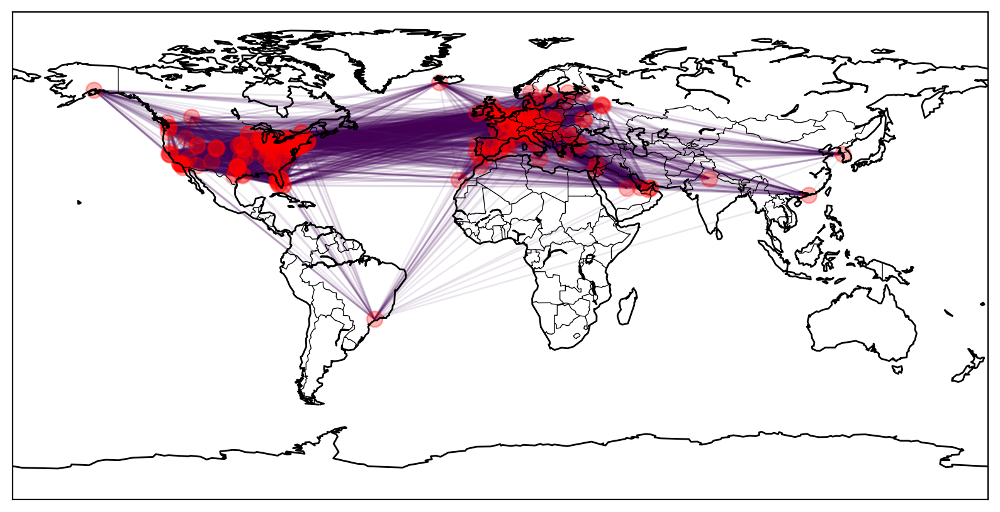

In [446]:
fig, axs = plt.subplots(1,figsize = (10,10), dpi=200)
draw_flights_on_map(g_2019.subgraph(get_node_list_by_t_value(layer_nodes, 1000, max(layer_nodes.keys()))),axs, draw_edge=False, node_size=80)

# Dec 2019 peripheral airports 

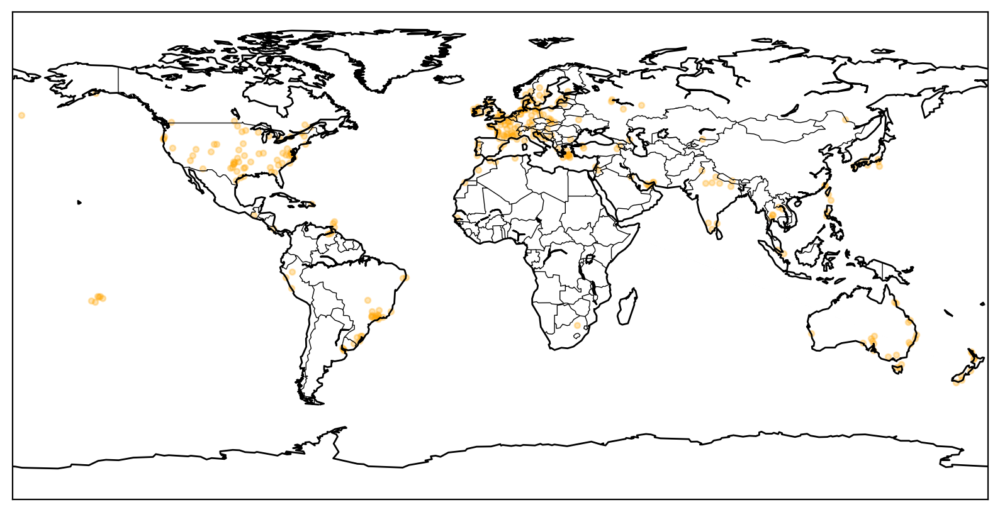

In [444]:
fig, axs = plt.subplots(1,figsize = (10,10), dpi=200)
draw_flights_on_map(g_2019.subgraph(layer_nodes[0]),axs, node_size=10,node_color='orange')

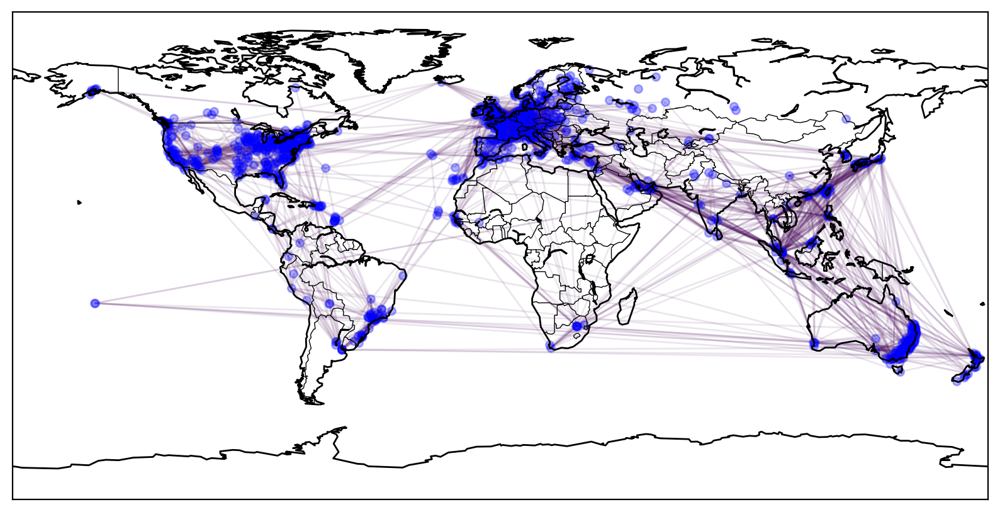

In [445]:
fig, axs = plt.subplots(1,figsize = (10,10), dpi=200)
draw_flights_on_map(g_2019.subgraph(get_node_list_by_t_value(layer_nodes, 1, 999)),axs, node_size=20, node_color='blue')

In [262]:
G.number_of_nodes()

4

In [264]:
G_sub = G.subgraph(['a'])
G_sub.number_of_nodes()

1

In [297]:
names = nx.get_node_attributes(g_2019, 'data')
g_2019.number_of_nodes()

1589

In [281]:
nx.set_node_attributes(g_2019, {'KJFK':6}, 'test_2')
test_2 = nx.get_node_attributes(g_2019, 'test_2')
'KJF' in test_2

False

In [284]:
a = [1]
b = [1,2,3]
a.append(b)
a

[1, [1, 2, 3]]

In [287]:
nodesAt5 = [x for x,y in g_2019.nodes(data=True) if x in test_2]
nodesAt5

['KJFK']

In [338]:
G

In [374]:
nx.triangles(G,'a')

1

In [347]:
a = {}
type(a) == dict

True

In [ ]:
g_2019['NZUK']

In [369]:
G.edges()

EdgeView([('a', 'b'), ('a', 'c'), ('c', 'd')])

In [373]:
G.add_edge('b','c')